# PhysioNet - Digitization of ECG Images

대회: https://moody-challenge.physionet.org/2024/

## ECG 이미지 검출 전체 파이프라인

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
# !ls /content/drive/MyDrive/physionet

In [3]:
# !ls /content/drive/MyDrive/physionet/archive

In [4]:
import sys, os

ARCHIVE_DIR = "/content/drive/MyDrive/physionet/archive"
sys.path.append(ARCHIVE_DIR)
os.chdir(ARCHIVE_DIR)

print(os.listdir(ARCHIVE_DIR))

['640106434-0001.gridpoint_xy.npy', '640106434-0001.overlay.png', 'sample_list.py', 'stage0-last.checkpoint.pth', 'stage0_common.py', 'stage1_model.py', 'stage0_model.py', 'stage2_common.py', 'stage2_model.py', 'stage1_common.py', 'stage1-last.checkpoint.pth', 'stage2-00005810.checkpoint.pth', 'setup', 'weight', '__pycache__', 'code.ipynb']


In [5]:
!pip install connected-components-3d

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 59.2 MB/s eta 0:00:00


In [6]:
import os
import cv2
import numpy as np
import torch
import pandas as pd
import matplotlib.pyplot as plt

# -------------------------------------------------
# GPU 설정
# -------------------------------------------------
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

# 경로 설정
KAGGLE_DIR = "/content/drive/MyDrive/physionet/physionet_dataset"  # train/test 루트
WEIGHT_DIR = "/content/drive/MyDrive/physionet/archive"            # stage0/1/2 .pth 폴더

# stage2에서 쓰는 고정 상수
RECT_H, RECT_W = 1700, 2200
X0, X1 = 0, 2176
Y0, Y1 = 0, 1696
ZERO_MV = [703.5, 987.5, 1271.5, 1531.5]
MV_TO_PIXEL = 79.0
T0, T1 = 118, 2080   # time span (x 방향 유효 구간)

# -------------------------------------------------
# stage 모듈 import
# -------------------------------------------------
from stage0_model import Net as Stage0Net
from stage0_common import (
    image_to_batch as stage0_image_to_batch,
    output_to_predict as stage0_output_to_predict,
    normalise_by_homography,
)

from stage1_model import Net as Stage1Net
from stage1_common import (
    output_to_predict as stage1_output_to_predict,
    rectify_image,
)

from stage2_model import Net as Stage2Net
from stage2_common import (
    pixel_to_series,
    filter_series_by_limits,
)

# -------------------------------------------------
# 모델 로드
# -------------------------------------------------
def load_models(
    weight_dir: str = WEIGHT_DIR,
    device: str = DEVICE,
):
    """stage0, 1, 2 모델을 로드해서 리턴"""
    # Stage 0
    stage0 = Stage0Net(pretrained=False)
    from stage0_common import load_net as load_net0
    stage0 = load_net0(stage0, os.path.join(weight_dir, "stage0-last.checkpoint.pth"))
    stage0.to(device)
    stage0.eval()

    # Stage 1
    stage1 = Stage1Net(pretrained=False)
    from stage1_common import load_net as load_net1
    stage1 = load_net1(stage1, os.path.join(weight_dir, "stage1-last.checkpoint.pth"))
    stage1.to(device)
    stage1.eval()

    # Stage 2
    stage2 = Stage2Net(pretrained=False)
    from stage2_common import load_net as load_net2
    stage2 = load_net2(stage2, os.path.join(weight_dir, "stage2-00005810.checkpoint.pth"))
    stage2.to(device)
    stage2.eval()

    return stage0, stage1, stage2


# -------------------------------------------------
# Stage 0: 방향/키포인트 -> 정규화 이미지
# -------------------------------------------------
def run_stage0(stage0, image_bgr: np.ndarray):
    """
    입력: BGR 이미지 (cv2.imread 그대로)
    출력: normalised RGB 이미지, keypoint, homography
    """
    # cv2는 BGR이니까 RGB로 변환
    image = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

    batch = stage0_image_to_batch(image)  # dict: {'image': tensor, 'tta': ...}
    batch["image"] = batch["image"].to(DEVICE)

    with torch.no_grad():
        output = stage0(batch)

    rotated, keypoint = stage0_output_to_predict(image, batch, output)
    normalised, keypoint_norm, homo = normalise_by_homography(rotated, keypoint)

    return normalised, keypoint_norm, homo


# -------------------------------------------------
# Stage 1: grid 검출 -> rectified 이미지
# -------------------------------------------------
def run_stage1(stage1, normalised_rgb: np.ndarray):
    """
    입력: Stage0에서 나온 RGB normalised 이미지
    출력: rectified RGB 이미지, gridpoint_xy (numpy)
    """
    image = normalised_rgb.astype(np.uint8)
    image_chw = np.ascontiguousarray(image.transpose(2, 0, 1))
    batch = {"image": torch.from_numpy(image_chw).unsqueeze(0).to(DEVICE)}

    with torch.no_grad():
        output = stage1(batch)

    gridpoint_xy, more = stage1_output_to_predict(image, batch, output)
    rectified = rectify_image(image, gridpoint_xy)

    return rectified, gridpoint_xy


# -------------------------------------------------
# Stage 2: rectified -> 4개의 strip 시계열
# -------------------------------------------------
def run_stage2(stage2, rectified_rgb: np.ndarray, length_lead_II: int):
    """
    rectified 이미지를 입력으로 받아 4개의 시계열 strip을 반환.
    length_lead_II: 리드 II 전체 길이 (예: floor(fs * 10))
    """
    image = rectified_rgb.astype(np.uint8)

    # rectified 좌표계에서 crop
    crop = image[Y0:Y1, X0:X1]  # (H, W, 3)
    crop_chw = np.ascontiguousarray(crop.transpose(2, 0, 1))
    batch = {"image": torch.from_numpy(crop_chw).unsqueeze(0).to(DEVICE)}

    with torch.no_grad():
        output = stage2(batch)

    pixel = output["pixel"].float().cpu().numpy()[0]  # (4, H', W_full)
    pixel_cropped = pixel[..., T0:T1]                 # time span만 사용

    # pixel → series (픽셀 단위 y좌표)
    series_in_pixel = pixel_to_series(pixel_cropped, ZERO_MV, length_lead_II)

    # 픽셀 → mV
    zero_mv_arr = np.array(ZERO_MV).reshape(4, 1)
    series_mv = (zero_mv_arr - series_in_pixel) / MV_TO_PIXEL

    # 값 범위 클리핑
    series_mv = filter_series_by_limits(series_mv)

    # shape: (4, length_lead_II)
    return series_mv


# -------------------------------------------------
# 4 strip -> 12 리드로 분해
# -------------------------------------------------
LEAD_GROUPS = [
    ["I", "aVR", "V1", "V4"],
    ["II", "aVL", "V2", "V5"],
    ["III", "aVF", "V3", "V6"],
]

def split_strips_to_leads(series4: np.ndarray, lead_lengths: dict):
    """
    series4: shape (4, L_II), strip0~3
    lead_lengths: 각 리드별 길이 dict, 예:
        {
          'I': L_short, 'II': L_long, ..., 'V6': L_short
        }
      - L_long: floor(fs*10)
      - L_short: floor(fs*2.5)
    반환: {lead_name: 1D np.ndarray}
    """
    series_by_lead = {}

    # strip 0~2는 여러 리드를 이어붙인 형태 → 길이대로 split
    for l in range(3):
        leads = LEAD_GROUPS[l]
        lengths = [lead_lengths[ld] for ld in leads]

        # strip2(II, aVL, V2, V5)에서 첫 리드 길이 조정
        if leads[0] == "II":
            lengths[0] = lengths[0] - sum(lengths[1:])

        idx = np.cumsum(lengths)[:-1]
        split_series = np.split(series4[l], idx)

        for k, s in zip(leads, split_series):
            series_by_lead[k] = s

    # strip3 전체가 리드 II rhythm strip
    series_by_lead["II"] = series4[3]

    return series_by_lead


# -------------------------------------------------
# 한 장의 이미지에 대해 전체 파이프라인 실행
# -------------------------------------------------
def digitize_ecg_image(
    image_path: str,
    fs: float,
    stage0=None,
    stage1=None,
    stage2=None,
):
    """
    image_path: train/test 이미지 경로
    fs: 샘플링 주파수 (Hz)
    stage0/1/2: 미리 load_models()로 로드해 둔 모델 (없으면 내부에서 로드)
    반환: {lead_name: np.ndarray (길이 number_of_rows)}
    """
    # 리드별 길이 계산
    length_long = int(np.floor(fs * 10.0))   # Lead II: 10초
    length_short = int(np.floor(fs * 2.5))   # 다른 리드: 2.5초

    lead_lengths = {
        "I": length_short,
        "II": length_long,
        "III": length_short,
        "aVR": length_short,
        "aVL": length_short,
        "aVF": length_short,
        "V1": length_short,
        "V2": length_short,
        "V3": length_short,
        "V4": length_short,
        "V5": length_short,
        "V6": length_short,
    }

    # 모델 준비
    if stage0 is None or stage1 is None or stage2 is None:
        stage0, stage1, stage2 = load_models()

    # 이미지 읽기
    image_bgr = cv2.imread(image_path, cv2.IMREAD_COLOR)
    if image_bgr is None:
        raise FileNotFoundError(f"Cannot read image: {image_path}")

    # Stage 0
    normalised_rgb, keypoint, homo = run_stage0(stage0, image_bgr)

    # Stage 1
    rectified_rgb, gridpoint_xy = run_stage1(stage1, normalised_rgb)

    # Stage 2
    series4 = run_stage2(stage2, rectified_rgb, length_long)

    # 4 strip → 12 leads
    series_by_lead = split_strips_to_leads(series4, lead_lengths)

    return series_by_lead


# -------------------------------------------------
# 헬퍼들: id 기반 digitize, SNR, 플롯
# -------------------------------------------------
# train 메타데이터
train_meta = pd.read_csv(f"{KAGGLE_DIR}/train.csv")
train_meta["id"] = train_meta["id"].astype(str)

def digitize_by_id(image_id: str, type_id: str = "0001",
                   stage0=None, stage1=None, stage2=None):
    """image_id, type_id('0001'~'0012') 기반으로 digitize 실행"""
    row = train_meta[train_meta["id"] == image_id].iloc[0]
    fs = float(row["fs"])
    image_path = f"{KAGGLE_DIR}/train/{image_id}/{image_id}-{type_id}.png"
    series = digitize_ecg_image(
        image_path=image_path,
        fs=fs,
        stage0=stage0,
        stage1=stage1,
        stage2=stage2,
    )
    return series, fs


def snr(gt, pred):
    noise = gt - pred
    return 10 * np.log10(np.sum(gt**2) / np.sum(noise**2))


def plot_gt_vs_pred_lead_ii(image_id: str, type_id: str = "0001",
                            seconds: float = 2.0):
    """
    특정 id에 대해 GT vs Pred Lead II를 그려줌 (항상 새로 추론)
    이렇게 하지 않으면 맨 처음 돌렸던 id의 결과가 pred_lead_ii에 남아서 잘못 찍힘
    """
    # 모델 한 번만 로드해서 재사용
    global stage0, stage1, stage2
    try:
        stage0
    except NameError:
        stage0, stage1, stage2 = load_models()

    series_by_lead, fs = digitize_by_id(
        image_id=image_id,
        type_id=type_id,
        stage0=stage0,
        stage1=stage1,
        stage2=stage2,
    )
    pred_lead_ii = series_by_lead["II"]

    csv_path = f"{KAGGLE_DIR}/train/{image_id}/{image_id}.csv"
    df = pd.read_csv(csv_path)
    gt_lead_ii = df["II"].values

    L = min(int(fs * seconds), len(gt_lead_ii), len(pred_lead_ii))
    t = np.arange(L) / fs
    s = snr(gt_lead_ii[:L], pred_lead_ii[:L])

    print(f"id={image_id}, type={type_id}, fs={fs}, L={L}, SNR={s:.3f} dB")

    plt.figure(figsize=(12, 4))
    plt.plot(t, gt_lead_ii[:L], label="GT II", linewidth=1)
    plt.plot(t, pred_lead_ii[:L], label="Pred II", linewidth=1, alpha=0.7)
    plt.legend()
    plt.grid(True)
    plt.xlabel("Time (s)")
    plt.ylabel("mV")
    plt.title(f"Lead II (first {seconds} s)  SNR={s:.3f} dB")
    plt.show()

THIS_DIR: /content/drive/.shortcut-targets-by-id/1lh0HbtE2SKHUKqHmstIMkh9c-83W0V2K/physionet/archive
REF_PT: (9, 2)
/content/drive/.shortcut-targets-by-id/1lh0HbtE2SKHUKqHmstIMkh9c-83W0V2K/physionet/archive
/content/drive/.shortcut-targets-by-id/1lh0HbtE2SKHUKqHmstIMkh9c-83W0V2K/physionet/archive


In [7]:
import os
import cv2
import numpy as np
import torch
import matplotlib.pyplot as plt
import pandas as pd

from stage0_common import (
    image_to_batch as stage0_image_to_batch,
    output_to_predict as stage0_output_to_predict,
    normalise_by_homography,
    draw_results_stage0,
)
from stage1_common import (
    output_to_predict as stage1_output_to_predict,
    rectify_image,
    draw_results_stage1,
    draw_mapping,
)
from stage2_common import (
    pixel_to_series,
    filter_series_by_limits,
    draw_lead_pixel,
)

# 메트릭 함수들

import numpy as np

def snr_db(gt, pred):
    """
    SNR [dB]
    gt, pred: 1D np.ndarray (mV 단위)
    """
    gt = np.asarray(gt)
    pred = np.asarray(pred)
    noise = gt - pred

    num = np.sum(gt ** 2)
    den = np.sum(noise ** 2)

    if den == 0:
        return np.inf
    if num == 0:
        return np.nan

    return 10.0 * np.log10(num / den)


def nrmse(gt, pred):
    """
    Normalized RMSE (0~1 정도 값; 여기서는 peak-to-peak로 정규화)
    """
    gt = np.asarray(gt)
    pred = np.asarray(pred)
    diff = gt - pred
    rmse = np.sqrt(np.mean(diff ** 2))

    ptp = gt.max() - gt.min()  # peak-to-peak
    if ptp == 0:
        return np.nan
    return rmse / ptp


def corr_coef(gt, pred):
    """
    Pearson correlation coefficient r
    """
    gt = np.asarray(gt)
    pred = np.asarray(pred)

    # 상수 신호면 corr 정의가 안 되므로 NaN
    if np.allclose(gt, gt[0]) or np.allclose(pred, pred[0]):
        return np.nan

    r = np.corrcoef(gt, pred)[0, 1]
    return float(r)


# 이미 위 셀에서 정의해둔 것 사용:
# DEVICE, KAGGLE_DIR, ZERO_MV, MV_TO_PIXEL, T0, T1,
# load_models, split_strips_to_leads, train_meta, snr 등

FIG_ROOT = "/content/drive/MyDrive/physionet/figures"


def save_figures_for_id_type(image_id: str, type_id: str = "0002"):
    """
    /content/drive/MyDrive/physionet/figures/{image_id}-{type_id}/ 안에
      fig_stage0_marker_overlay.png
      fig_stage0_normalised.png
      fig_stage1_gh.png
      fig_stage1_gv.png
      fig_stage1_mapping.png
      fig_stage1_rectified.png
      fig_stage2_pixel_overlay.png
      fig_stage2_series.png   # 12개 리드 GT vs Pred + SNR
    를 저장한다.
    """

    # -------------------------------------------------
    # 출력 디렉토리 준비
    # -------------------------------------------------
    out_dir = os.path.join(FIG_ROOT, f"{image_id}-{type_id}")
    os.makedirs(out_dir, exist_ok=True)

    # -------------------------------------------------
    # 모델 준비 (global에 stage0/1/2가 없으면 로드)
    # -------------------------------------------------
    global stage0, stage1, stage2
    try:
        stage0
    except NameError:
        stage0, stage1, stage2 = load_models()

    # -------------------------------------------------
    # 메타 / 이미지 로드
    # -------------------------------------------------
    row = train_meta[train_meta["id"] == image_id].iloc[0]
    fs = float(row["fs"])

    image_path = f"{KAGGLE_DIR}/train/{image_id}/{image_id}-{type_id}.png"
    image_bgr = cv2.imread(image_path, cv2.IMREAD_COLOR)
    if image_bgr is None:
        raise FileNotFoundError(image_path)

    # ================================================
    # Stage 0: marker overlay, normalised 이미지
    # ================================================
    image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

    batch0 = stage0_image_to_batch(image_rgb)
    batch0["image"] = batch0["image"].to(DEVICE)

    with torch.no_grad():
        out0 = stage0(batch0)

    rotated, keypoint = stage0_output_to_predict(image_rgb, batch0, out0)
    normalised, keypoint_norm, homo = normalise_by_homography(rotated, keypoint)

    overlay0 = draw_results_stage0(rotated.copy(), keypoint_norm)

    cv2.imwrite(
        os.path.join(out_dir, "fig_stage0_marker_overlay.png"),
        cv2.cvtColor(overlay0, cv2.COLOR_RGB2BGR),
    )
    cv2.imwrite(
        os.path.join(out_dir, "fig_stage0_normalised.png"),
        cv2.cvtColor(normalised, cv2.COLOR_RGB2BGR),
    )

    print(f"[{image_id}-{type_id}] Stage0 figures saved.")

    # ================================================
    # Stage 1: gh/gv colormap, mapping, rectified
    # ================================================
    image_norm = normalised.astype(np.uint8)
    image_chw = np.ascontiguousarray(image_norm.transpose(2, 0, 1))
    batch1 = {"image": torch.from_numpy(image_chw).unsqueeze(0).to(DEVICE)}

    with torch.no_grad():
        out1 = stage1(batch1)

    gridpoint_xy, more = stage1_output_to_predict(image_norm, batch1, out1)
    gh_colormap, gv_colormap = draw_results_stage1(more)
    mapping_overlay = draw_mapping(image_norm.copy(), gridpoint_xy)
    rectified = rectify_image(image_norm, gridpoint_xy)

    cv2.imwrite(
        os.path.join(out_dir, "fig_stage1_gh.png"),
        gh_colormap,
    )
    cv2.imwrite(
        os.path.join(out_dir, "fig_stage1_gv.png"),
        gv_colormap,
    )
    cv2.imwrite(
        os.path.join(out_dir, "fig_stage1_mapping.png"),
        cv2.cvtColor(mapping_overlay, cv2.COLOR_RGB2BGR),
    )
    cv2.imwrite(
        os.path.join(out_dir, "fig_stage1_rectified.png"),
        cv2.cvtColor(rectified, cv2.COLOR_RGB2BGR),
    )

    print(f"[{image_id}-{type_id}] Stage1 figures saved.")

    # ================================================
    # Stage 2: pixel overlay + 12리드 GT vs Pred 그래프
    # ================================================
    # rectified 기준 crop → stage2 추론
    crop = rectified[Y0:Y1, X0:X1]  # (H, W, 3)
    crop_chw = np.ascontiguousarray(crop.transpose(2, 0, 1))
    batch2 = {"image": torch.from_numpy(crop_chw).unsqueeze(0).to(DEVICE)}

    with torch.no_grad():
        out2 = stage2(batch2)

    # pixel: (4, H', W_full)
    pixel = out2["pixel"].float().cpu().numpy()[0]
    pixel_cropped = pixel[..., T0:T1]  # (4, H', W_valid)

    # pixel overlay (그림용)
    overlay2 = draw_lead_pixel(crop.copy(), pixel)
    cv2.imwrite(
        os.path.join(out_dir, "fig_stage2_pixel_overlay.png"),
        cv2.cvtColor(overlay2, cv2.COLOR_RGB2BGR),
    )

    # strip 4개 → 시계열 4개 (run_stage2 로직과 동일)
    length_long = int(np.floor(fs * 10.0))   # Lead II: 10초
    series_in_pixel = pixel_to_series(pixel_cropped, ZERO_MV, length_long)
    zero_mv_arr = np.array(ZERO_MV).reshape(4, 1)
    series_mv = (zero_mv_arr - series_in_pixel) / MV_TO_PIXEL
    series_mv = filter_series_by_limits(series_mv)  # (4, L_II)

    # 4 strip → 12 lead
    length_short = int(np.floor(fs * 2.5))
    lead_lengths = {
        "I": length_short,
        "II": length_long,
        "III": length_short,
        "aVR": length_short,
        "aVL": length_short,
        "aVF": length_short,
        "V1": length_short,
        "V2": length_short,
        "V3": length_short,
        "V4": length_short,
        "V5": length_short,
        "V6": length_short,
    }
    series_by_lead = split_strips_to_leads(series_mv, lead_lengths)

    # GT 시계열 로딩
    csv_path = f"{KAGGLE_DIR}/train/{image_id}/{image_id}.csv"
    df = pd.read_csv(csv_path)

    SEG_LEN = 625  # fs*2.5 가 625라고 가정

    # 원본 CSV에서 각 리드가 존재하는 구간 (샘플 인덱스)
    lead_segments = {
        "I":   (0,    SEG_LEN),
        "II":  (0,   4*SEG_LEN),
        "III": (0,    SEG_LEN),
        "aVR": (1*SEG_LEN, 2*SEG_LEN),
        "aVL": (1*SEG_LEN, 2*SEG_LEN),
        "aVF": (1*SEG_LEN, 2*SEG_LEN),
        "V1":  (2*SEG_LEN, 3*SEG_LEN),
        "V2":  (2*SEG_LEN, 3*SEG_LEN),
        "V3":  (2*SEG_LEN, 3*SEG_LEN),
        "V4":  (3*SEG_LEN, 4*SEG_LEN),
        "V5":  (3*SEG_LEN, 4*SEG_LEN),
        "V6":  (3*SEG_LEN, 4*SEG_LEN),
    }

    leads_order = ["I", "II", "III", "aVR", "aVL", "aVF",
                   "V1", "V2", "V3", "V4", "V5", "V6"]

    plt.figure(figsize=(12, 10))

    for idx, lead in enumerate(leads_order):
        if lead not in series_by_lead:
            continue

        # 예측 시퀀스
        pred = series_by_lead[lead]

        # 리드별 GT 구간 자르기
        start, end = lead_segments[lead]
        gt_full = df[lead].values
        gt_seg = gt_full[start:end]

        # NaN 전부면 이 리드는 스킵
        if np.isnan(gt_seg).all():
            s_val = np.nan
            n_val = np.nan
            r_val = np.nan
            gt_use = None
            pred_use = None
            t = None
        else:
            # 길이 맞추기
            L = min(len(pred), len(gt_seg))
            gt_use = gt_seg[:L]
            pred_use = pred[:L]

            # 시간축
            t = np.arange(L) / fs

            # 메트릭 계산
            s_val = snr_db(gt_use, pred_use)
            n_val = nrmse(gt_use, pred_use)
            r_val = corr_coef(gt_use, pred_use)

        ax = plt.subplot(4, 3, idx + 1)

        if gt_use is not None:
            ax.plot(t, gt_use, label="GT", linewidth=0.7)
        if pred_use is not None:
            ax.plot(t, pred_use, label="Pred", linewidth=0.7, alpha=0.8)

        # 문자열 포맷팅
        if np.isnan(s_val):
            snr_str = "N/A"
        elif np.isinf(s_val):
            snr_str = "inf"
        else:
            snr_str = f"{s_val:.2f}"

        if np.isnan(n_val):
            nrmse_str = "N/A"
        else:
            # 0~1 값을 퍼센트로 표시할 거면 ×100
            nrmse_str = f"{n_val*100:.2f}%"

        if np.isnan(r_val):
            corr_str = "N/A"
        else:
            corr_str = f"{r_val:.3f}"

        ax.set_title(
            f"{lead} (SNR={snr_str} dB, NRMSE={nrmse_str}, r={corr_str})",
            fontsize=9
        )
        ax.tick_params(labelsize=7)
        if idx % 3 == 0:
            ax.set_ylabel("mV", fontsize=8)
        if idx // 3 == 3:
            ax.set_xlabel("Time (s)", fontsize=8)
        ax.grid(True)

    plt.tight_layout()
    plt.savefig(os.path.join(out_dir, "fig_stage2_series.png"), dpi=300)
    plt.close()

    print(f"[{image_id}-{type_id}] Stage2 figures saved.")


# -------------------------------------------------
# 예시 실행: 0001을 제외한 다른 type_id에 대해
# -------------------------------------------------

#     '''
#     -0001: ECG-image-kit으로 생성한 “원본” 스타일
#     -0003: 컬러 프린트 → 컬러 스캔
#     -0004: 컬러 프린트 → 흑백 스캔
#     -0005: 인쇄물 모바일 사진
#     -0006: 노트북 화면을 모바일로 찍은 것
#     -0009, -0010, -0011, -0012: 얼룩, 젖음, 손상, 곰팡이 등 다양한 노이즈 상황
#     '''

# 예: 한 image_id에 대해 0003~0012까지
IMAGE_ID = "46930936"
#TYPE_IDS = ["0003", "0004", "0005", "0006", "0007", "0008", "0009", "0010", "0011", "0012"]
TYPE_IDS = ["0010"]

for tid in TYPE_IDS:
    save_figures_for_id_type(IMAGE_ID, tid)

<All keys matched successfully>
<All keys matched successfully>
<All keys matched successfully>
[46930936-0010] Stage0 figures saved.
[46930936-0010] Stage1 figures saved.
[46930936-0010] Stage2 figures saved.


## 여기서부터는 샘플 이미지 생성 / 성능 평가 / 지식증류 실험. 윗 셀까지만 보시면 됩니다.

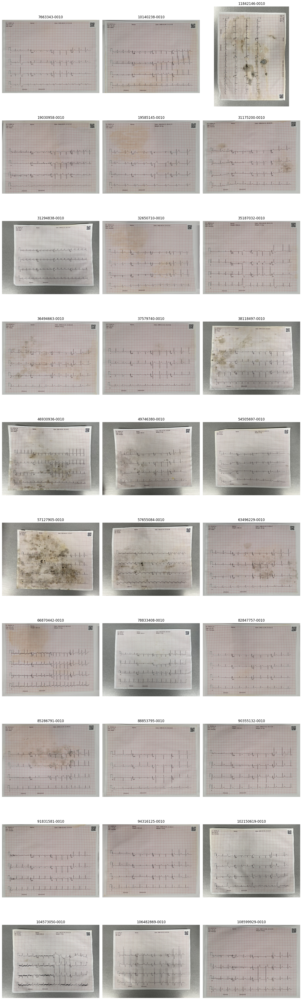

In [8]:
# 샘플 이미지 고르기

import cv2
import matplotlib.pyplot as plt

TYPE_ID = "0010"
MAX_IMAGES = 30
count = 0

plt.figure(figsize=(15, 50))

for idx, row in train_meta.iterrows():
    image_id = str(row["id"])
    img_path = f"{KAGGLE_DIR}/train/{image_id}/{image_id}-{TYPE_ID}.png"

    try:
        img = cv2.imread(img_path)
        if img is None:
            continue
    except:
        continue

    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.subplot(10, 3, count + 1)
    plt.imshow(img_rgb)
    plt.title(f"{image_id}-{TYPE_ID}")
    plt.axis("off")

    count += 1
    if count >= MAX_IMAGES:
        break

plt.tight_layout()
plt.show()

### 성능 평가 위해

In [9]:
import numpy as np
import pandas as pd
import os
from tqdm import tqdm  # 없으면 !pip install tqdm

# -------------------------------------------------
# 설정
# -------------------------------------------------
N_SAMPLES   = 200        # 몇 개 id를 평가할지
TYPE_ID     = "0001"     # 이미지 타입 (0001, 0003, 0005, ...)
RANDOM_SEED = 42
OUT_CSV     = f"/content/leadII_snr_type{TYPE_ID}_N{N_SAMPLES}.csv"

# -------------------------------------------------
# 평가에 사용할 id 리스트 만들기
# -------------------------------------------------
all_ids = train_meta["id"].unique().tolist()

rng = np.random.default_rng(RANDOM_SEED)
if N_SAMPLES >= len(all_ids):
    eval_ids = all_ids
else:
    eval_ids = rng.choice(all_ids, size=N_SAMPLES, replace=False)

print(f"총 {len(all_ids)}개 중 {len(eval_ids)}개 id 사용 (type {TYPE_ID})")


# -------------------------------------------------
# 모델 준비 (한 번만 로드해서 계속 사용)
# -------------------------------------------------
try:
    stage0
    stage1
    stage2
except NameError:
    stage0, stage1, stage2 = load_models()


# -------------------------------------------------
# 메인 루프: 각 id에 대해 Lead II SNR 계산
# -------------------------------------------------
records = []

for image_id in tqdm(eval_ids):
    # fs, 경로 세팅
    row = train_meta[train_meta["id"] == image_id].iloc[0]
    fs = float(row["fs"])
    image_path = f"{KAGGLE_DIR}/train/{image_id}/{image_id}-{TYPE_ID}.png"
    csv_path   = f"{KAGGLE_DIR}/train/{image_id}/{image_id}.csv"

    if not os.path.exists(image_path):
        # 해당 type의 이미지가 없으면 건너뜀
        continue
    if not os.path.exists(csv_path):
        continue

    try:
        # 예측 시계열
        series_by_lead = digitize_ecg_image(
            image_path=image_path,
            fs=fs,
            stage0=stage0,
            stage1=stage1,
            stage2=stage2,
        )
    except Exception as e:
        print(f"\n[WARN] digitize 실패: id={image_id}, err={e}")
        continue

    if "II" not in series_by_lead:
        continue
    pred_ii = series_by_lead["II"]

    # GT
    df = pd.read_csv(csv_path)
    if "II" not in df.columns:
        continue
    gt_ii = df["II"].values

    L = min(len(gt_ii), len(pred_ii))
    if L == 0:
        continue

    this_snr = snr(gt_ii[:L], pred_ii[:L])

    records.append({
        "id": image_id,
        "type_id": TYPE_ID,
        "fs": fs,
        "length_used": L,
        "snr_lead_II_db": this_snr,
    })

# -------------------------------------------------
# 결과 정리 및 저장
# -------------------------------------------------
results_df = pd.DataFrame(records)
print(f"\n유효 샘플 수: {len(results_df)}")
print(results_df.describe())

results_df.to_csv(OUT_CSV, index=False)
print(f"\n저장 완료: {OUT_CSV}")

총 977개 중 200개 id 사용 (type 0001)


100%|██████████| 200/200 [19:25<00:00,  5.83s/it]


유효 샘플 수: 200
                fs   length_used  snr_lead_II_db
count   200.000000    200.000000      200.000000
mean    630.725000   6307.250000       13.762022
std     325.691671   3256.916712        2.793370
min     250.000000   2500.000000        2.616157
25%     256.000000   2560.000000       12.238574
50%     512.000000   5120.000000       13.806730
75%    1000.000000  10000.000000       15.249114
max    1025.000000  10250.000000       21.822707

저장 완료: /content/leadII_snr_type0001_N200.csv


### 성능 측정

In [11]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2
import torch

# stage 공통에서 필요한 추가 함수들 import
from stage0_common import (
    image_to_batch as stage0_image_to_batch,
    output_to_predict as stage0_output_to_predict,
    normalise_by_homography,
    draw_results_stage0,
)
from stage1_common import (
    output_to_predict as stage1_output_to_predict,
    rectify_image,
    draw_mapping,
    draw_results_stage1,
)
from stage2_common import (
    pixel_to_series,
    filter_series_by_limits,
    draw_lead_pixel,
)

# -------------------------------------------------
# 메타데이터 / 모델 준비
# -------------------------------------------------
train_meta = pd.read_csv(f"{KAGGLE_DIR}/train.csv")
train_meta["id"] = train_meta["id"].astype(str)

try:
    stage0, stage1, stage2
except NameError:
    print("모델을 새로 로드합니다.")
    stage0, stage1, stage2 = load_models()

stage0.eval()
stage1.eval()
stage2.eval()

# -------------------------------------------------
# SNR 함수
# -------------------------------------------------
def snr(gt, pred):
    noise = gt - pred
    return 10 * np.log10(np.sum(gt**2) / np.sum(noise**2))


# -------------------------------------------------
# 1) 여러 id에 대해 SNR 계산해 보기
# -------------------------------------------------
def eval_snr_for_ids(base_ids, type_id="0001", fs_from_csv=True):
    """
    base_ids: ['1068062585', '1026034238', ...] 형태 리스트
    type_id: '0001' ~ '0012' 중 선택
    fs_from_csv: True이면 train.csv에서 fs 읽어옴
    """
    results = []

    for bid in base_ids:
        row = train_meta[train_meta["id"] == bid].iloc[0]
        fs = float(row["fs"]) if fs_from_csv else 500.0

        image_path = f"{KAGGLE_DIR}/train/{bid}/{bid}-{type_id}.png"
        if not os.path.exists(image_path):
            print(f"[WARN] 이미지 없음: {image_path}")
            continue

        # 예측 시계열
        series_by_lead = digitize_ecg_image(
            image_path=image_path,
            fs=fs,
            stage0=stage0,
            stage1=stage1,
            stage2=stage2,
        )
        pred_ii = series_by_lead["II"]

        # GT 시계열
        csv_path = f"{KAGGLE_DIR}/train/{bid}/{bid}.csv"
        df = pd.read_csv(csv_path)
        gt_ii = df["II"].values

        L = min(len(gt_ii), len(pred_ii))
        s = snr(gt_ii[:L], pred_ii[:L])

        print(f"id={bid}, type={type_id}, SNR={s:.3f} dB (len={L})")
        results.append((bid, s))

    return results



# -------------------------------------------------
# 2) 한 id에 대해 Stage0/1/2 중간 결과 시각화
# -------------------------------------------------
# Stage2에서 사용하는 상수
RECT_H, RECT_W = 1700, 2200
X0, X1 = 0, 2176
Y0, Y1 = 0, 1696
ZERO_MV = [703.5, 987.5, 1271.5, 1531.5]
MV_TO_PIXEL = 79.0
T0, T1 = 118, 2080

def debug_one_sample(image_id: str, type_id: str = "0001"):
    """
    한 샘플에 대해:
      - Stage0: rotated + keypoint overlay, normalised
      - Stage1: grid mapping overlay, rectified
      - Stage2: lead pixel overlay, GT vs Pred II plot, SNR
    를 한 번에 보여주는 디버그 함수
    """
    row = train_meta[train_meta["id"] == image_id].iloc[0]
    fs = float(row["fs"])

    image_path = f"{KAGGLE_DIR}/train/{image_id}/{image_id}-{type_id}.png"
    csv_path = f"{KAGGLE_DIR}/train/{image_id}/{image_id}.csv"

    print(f"image_id={image_id}, type_id={type_id}, fs={fs}")
    print("image_path:", image_path)
    print("csv_path:", csv_path)

    # -------- Stage0 --------
    image_bgr = cv2.imread(image_path, cv2.IMREAD_COLOR)
    if image_bgr is None:
        raise FileNotFoundError(image_path)
    image = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

    batch0 = stage0_image_to_batch(image)
    batch0["image"] = batch0["image"].to(DEVICE)

    with torch.no_grad():
        out0 = stage0(batch0)

    rotated, keypoint = stage0_output_to_predict(image, batch0, out0)
    normalised, keypoint_norm, homo = normalise_by_homography(rotated, keypoint)
    overlay0 = draw_results_stage0(rotated, keypoint)

    # -------- Stage1 --------
    img1 = normalised.astype(np.uint8)
    img1_chw = np.ascontiguousarray(img1.transpose(2, 0, 1))
    batch1 = {"image": torch.from_numpy(img1_chw).unsqueeze(0).to(DEVICE)}

    with torch.no_grad():
        out1 = stage1(batch1)

    gridpoint_xy, more = stage1_output_to_predict(img1, batch1, out1)
    rectified = rectify_image(img1, gridpoint_xy)
    overlay1 = draw_mapping(img1, gridpoint_xy)
    ghfiltered, gvfiltered = draw_results_stage1(more)

    # -------- Stage2 --------
    # crop & forward (pixel map 얻기)
    rect_u8 = rectified.astype(np.uint8)
    crop = rect_u8[Y0:Y1, X0:X1]
    crop_chw = np.ascontiguousarray(crop.transpose(2, 0, 1))
    batch2 = {"image": torch.from_numpy(crop_chw).unsqueeze(0).to(DEVICE)}

    with torch.no_grad():
        out2 = stage2(batch2)

    pixel = out2["pixel"].float().cpu().numpy()[0]
    pixel_cropped = pixel[..., T0:T1]
    crop_cropped = crop[:, T0:T1]

    # pixel → series
    length_long = int(np.floor(fs * 10.0))
    series_in_pixel = pixel_to_series(pixel_cropped, ZERO_MV, length_long)
    zero_mv_arr = np.array(ZERO_MV).reshape(4, 1)
    series_mv = (zero_mv_arr - series_in_pixel) / MV_TO_PIXEL
    series_mv = filter_series_by_limits(series_mv)

    # GT / SNR
    df = pd.read_csv(csv_path)
    gt_ii = df["II"].values
    pred_ii = series_mv[3]  # strip3 = II rhythm
    L = min(len(gt_ii), len(pred_ii))
    s = snr(gt_ii[:L], pred_ii[:L])
    print(f"SNR(Lead II, first {L} samples) = {s:.3f} dB")

    # -------- 시각화 --------
    # Stage0
    plt.figure(figsize=(12, 4))
    plt.imshow(overlay0)
    plt.title("Stage0: rotated + keypoints")
    plt.axis("off")
    plt.show()

    plt.figure(figsize=(12, 4))
    plt.imshow(normalised)
    plt.title("Stage0: normalised")
    plt.axis("off")
    plt.show()

    # Stage1
    plt.figure(figsize=(12, 4))
    plt.imshow(overlay1)
    plt.title("Stage1: grid mapping overlay")
    plt.axis("off")
    plt.show()

    plt.figure(figsize=(12, 4))
    plt.imshow(rectified)
    plt.title("Stage1: rectified image")
    plt.axis("off")
    plt.show()

    # Stage2
    overlay2 = draw_lead_pixel(crop_cropped, pixel_cropped)
    plt.figure(figsize=(12, 4))
    plt.imshow(overlay2)
    plt.title("Stage2: lead pixel overlay (crop)")
    plt.axis("off")
    plt.show()

    # GT vs Pred II (앞 2초만)
    t = np.arange(min(1000, L)) / fs
    plt.figure(figsize=(12, 4))
    plt.plot(t, gt_ii[: len(t)], label="GT II", linewidth=1)
    plt.plot(t, pred_ii[: len(t)], label="Pred II", linewidth=1, alpha=0.7)
    plt.legend()
    plt.grid(True)
    plt.xlabel("Time (s)")
    plt.ylabel("mV")
    plt.title(f"Lead II (first {len(t)} samples) – SNR={s:.3f} dB")
    plt.show()

id=1068062585, type=0012, SNR=13.612 dB (len=5120)
id=1026034238, type=0012, SNR=18.712 dB (len=2560)
image_id=1026034238, type_id=0012, fs=256.0
image_path: /content/drive/MyDrive/physionet/physionet_dataset/train/1026034238/1026034238-0012.png
csv_path: /content/drive/MyDrive/physionet/physionet_dataset/train/1026034238/1026034238.csv
SNR(Lead II, first 2560 samples) = 18.712 dB


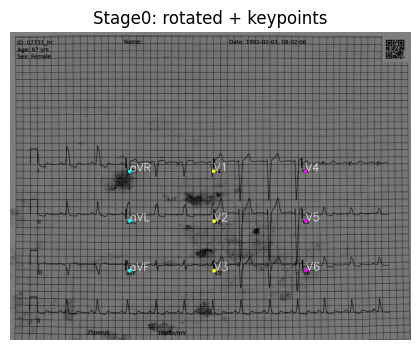

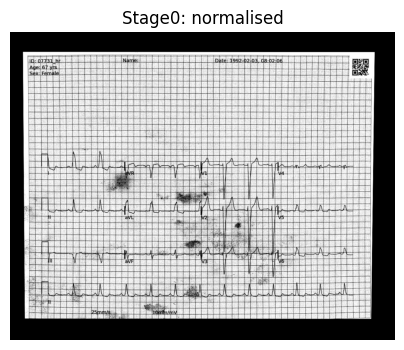

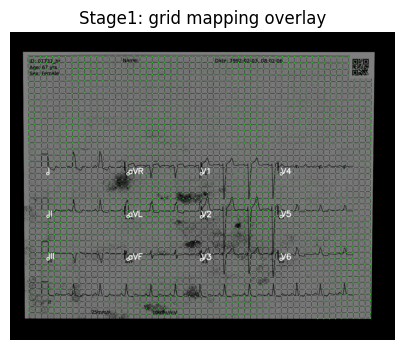

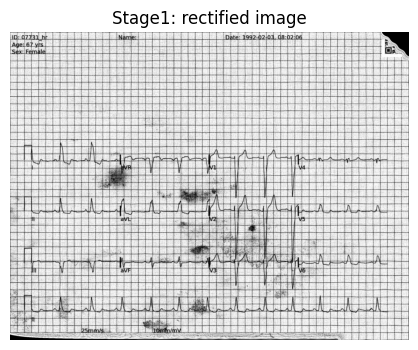

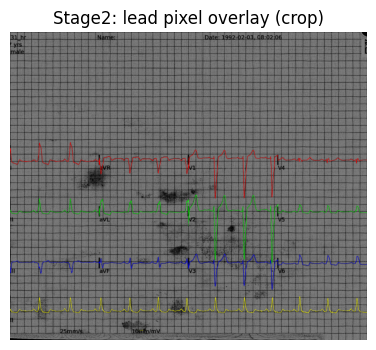

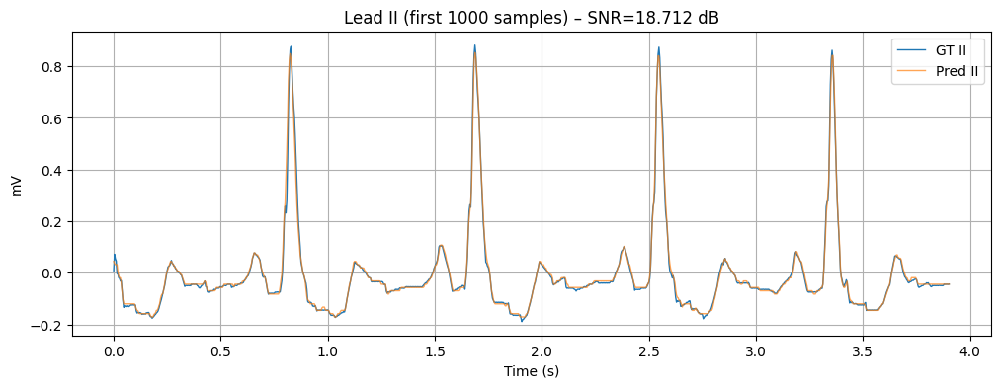

In [12]:
# 실행:
# 1) 여러 id SNR 보기
base_ids = ['1068062585', '1026034238']
_ = eval_snr_for_ids(base_ids, type_id="0012")

# 2) 한 샘플 디버깅
debug_one_sample("1026034238", type_id="0012")

### worst-case 확인
- SNR 10 dB 미만 worst-case는 샘플 200개 중 5개였다.
- 5 dB 이하는 unreliable, 10 dB 이상은 clinically usable, 20 db 이상은 preserved morphology이다.
- 소수 케이스지만 문제는 그리드 검출이 잘못 되었을 때 발생하는 것으로 추정되고
- 추가적인 성능 향상을 위해서 stage 2 모델 실험을 할 수 있을 것 같다.

총 샘플 수: 200
Worst-case IDs: ['106482869', '4267219232', '2617381459', '3607942876', '3451118512']

===== Debug id=106482869, type=0001 =====


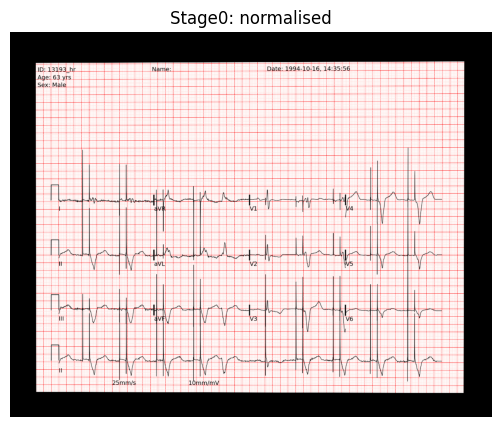

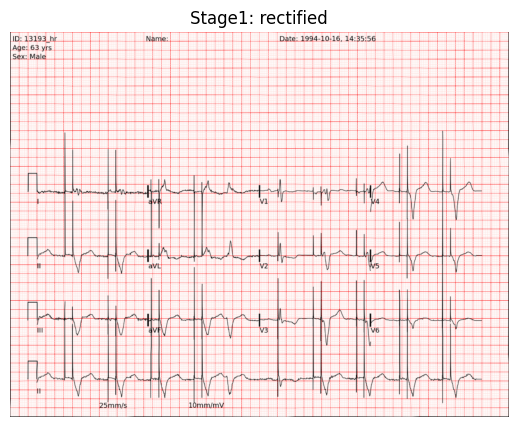

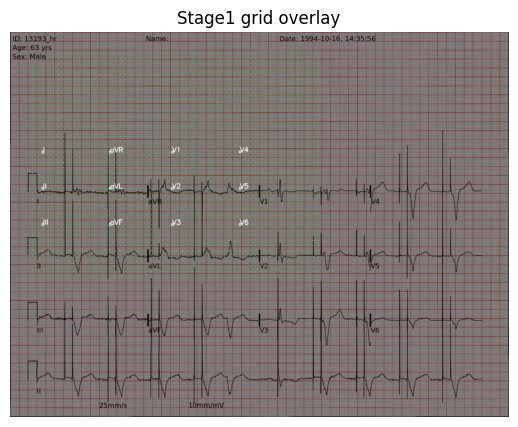

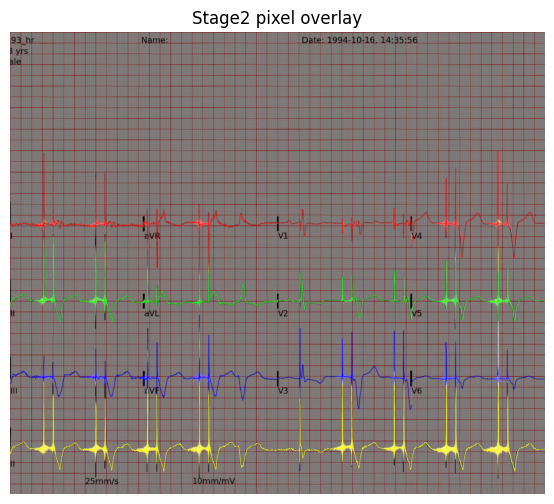

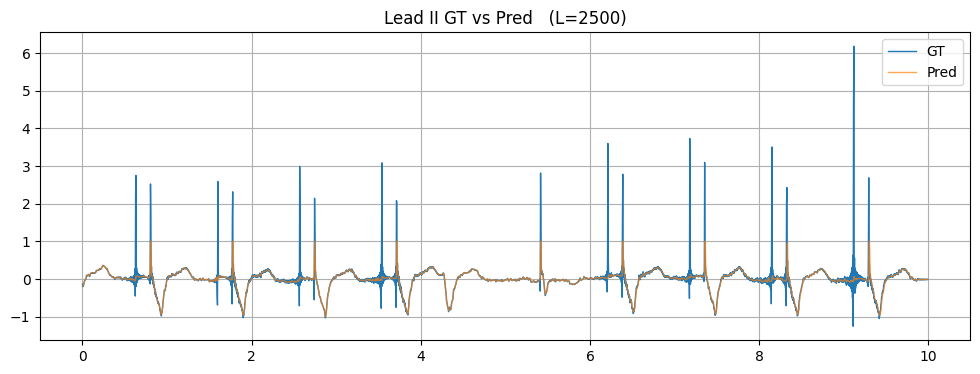

SNR = 2.616 dB

===== Debug id=4267219232, type=0001 =====


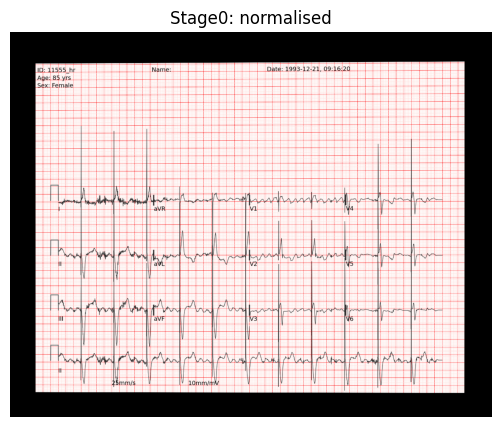

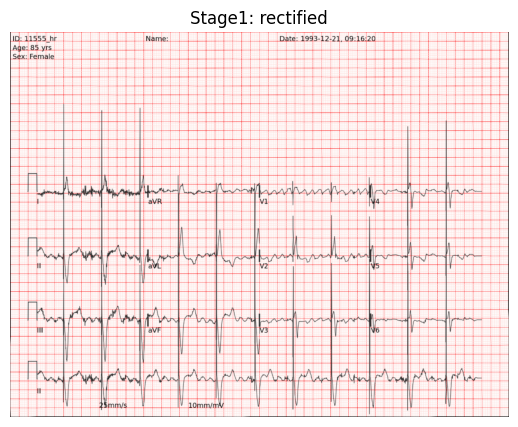

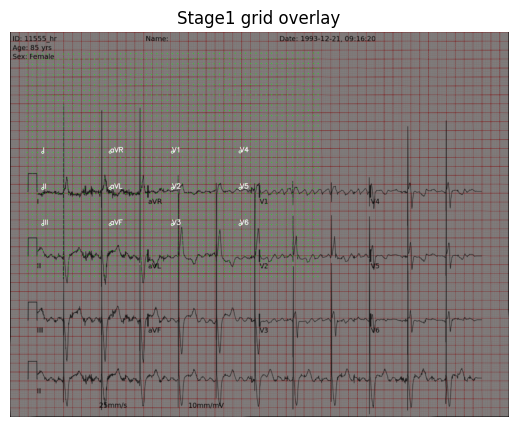

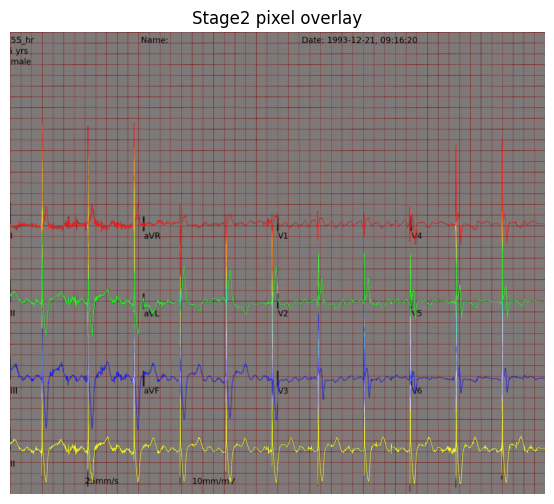

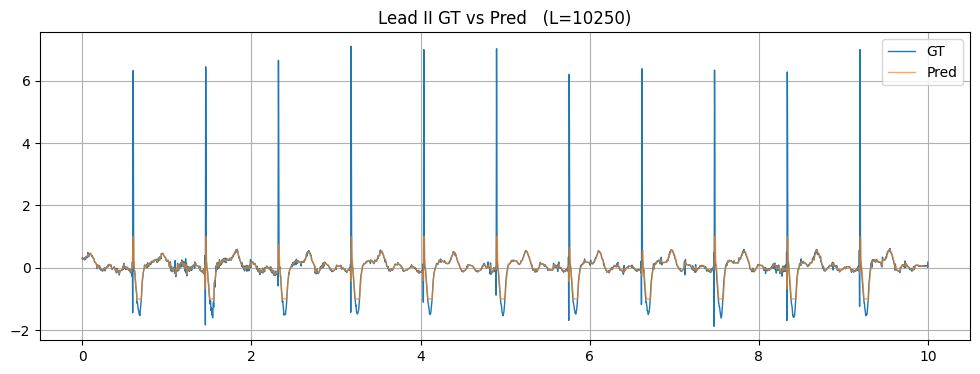

SNR = 2.963 dB

===== Debug id=2617381459, type=0001 =====


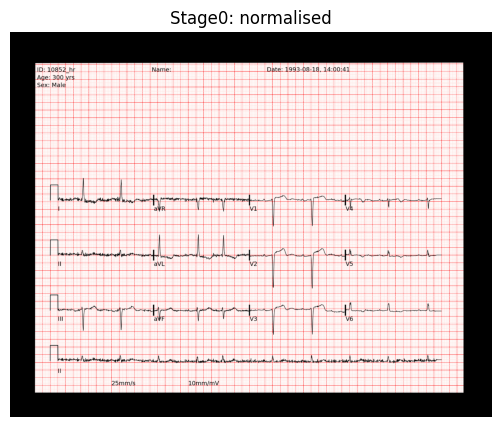

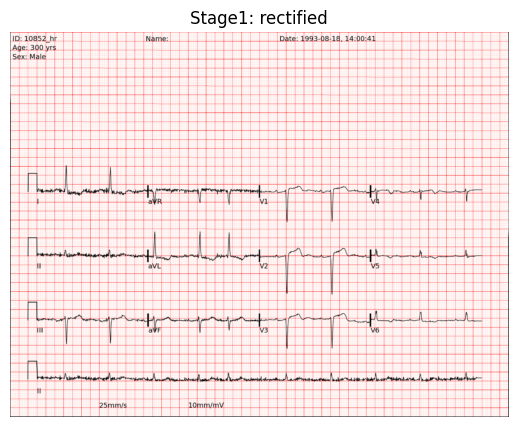

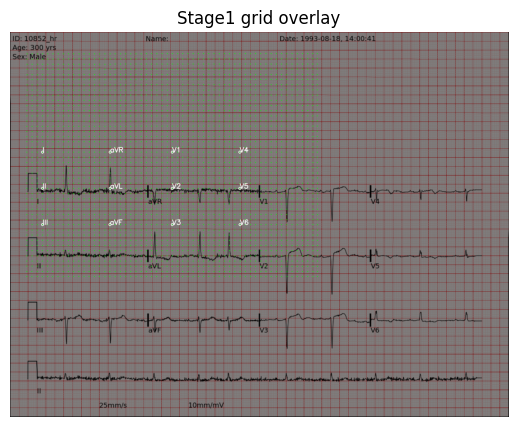

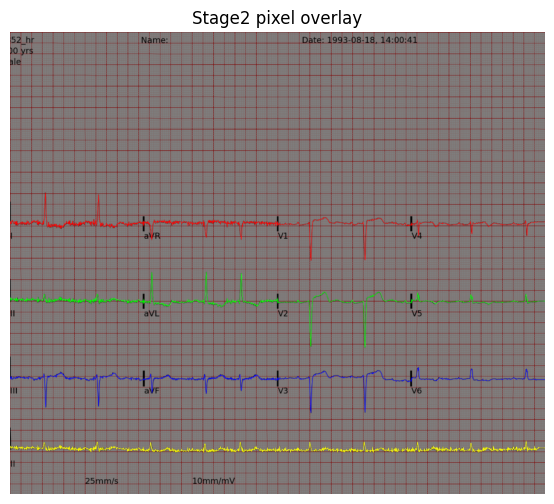

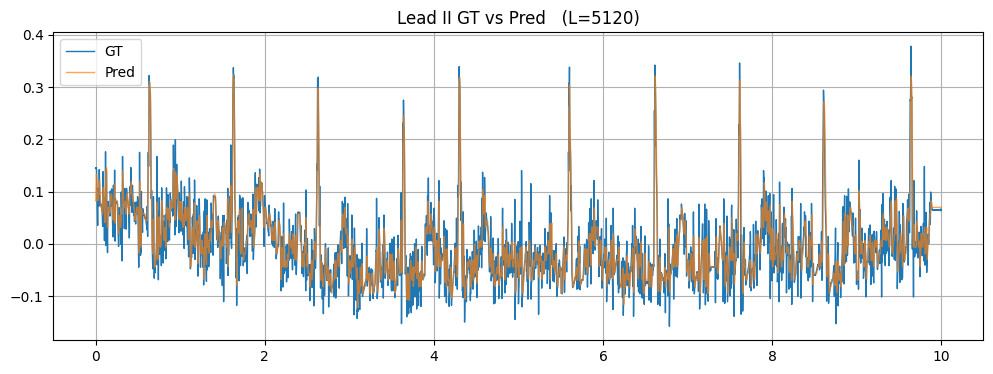

SNR = 7.341 dB

===== Debug id=3607942876, type=0001 =====


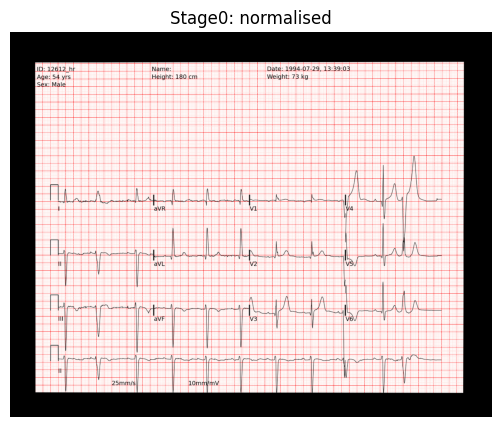

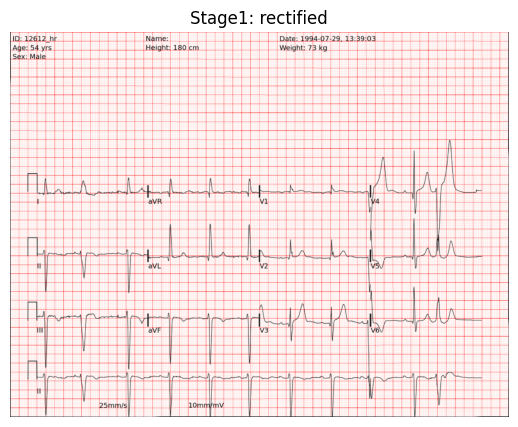

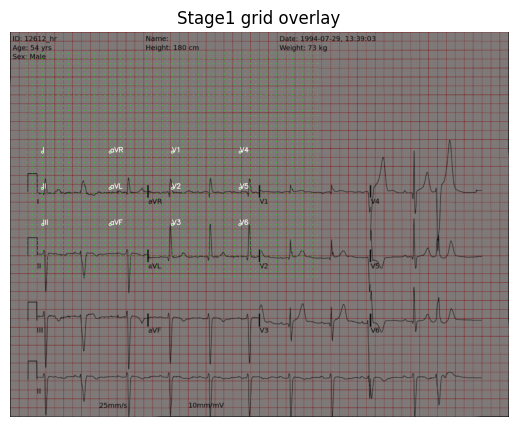

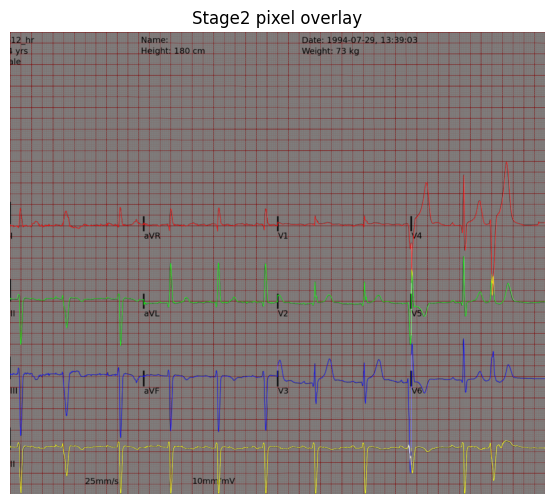

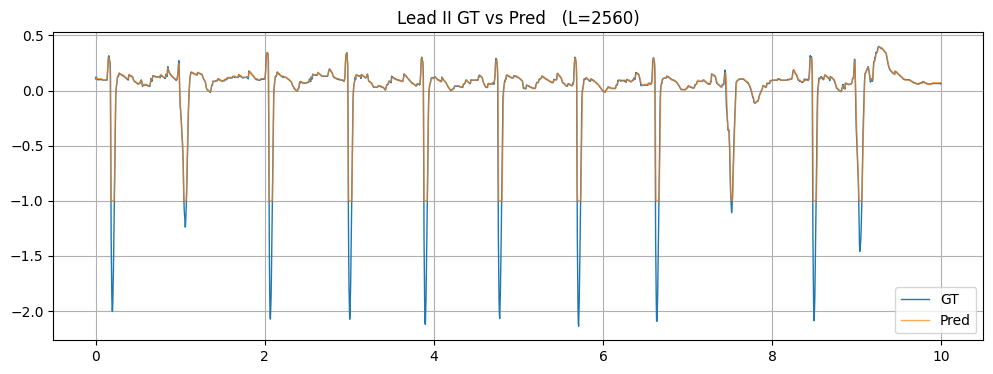

SNR = 8.020 dB

===== Debug id=3451118512, type=0001 =====


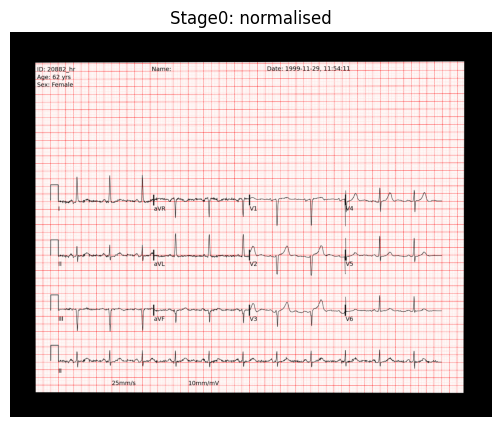

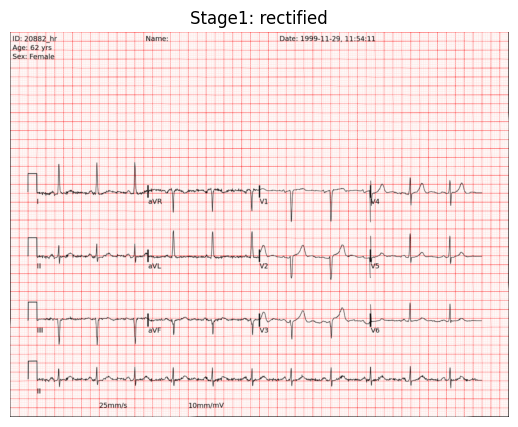

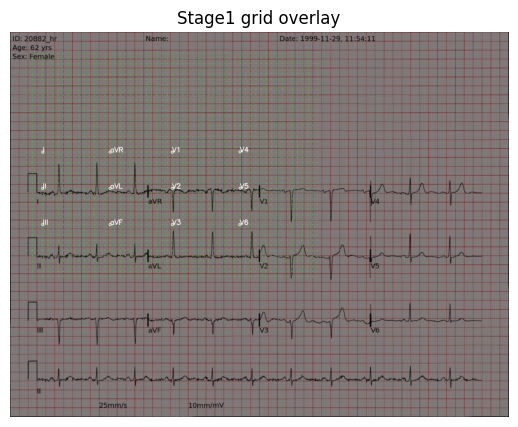

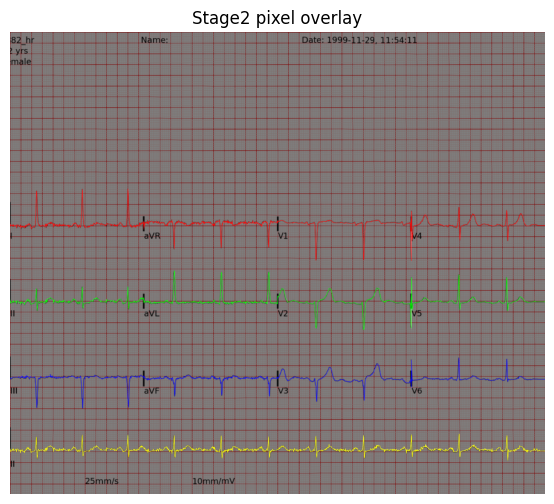

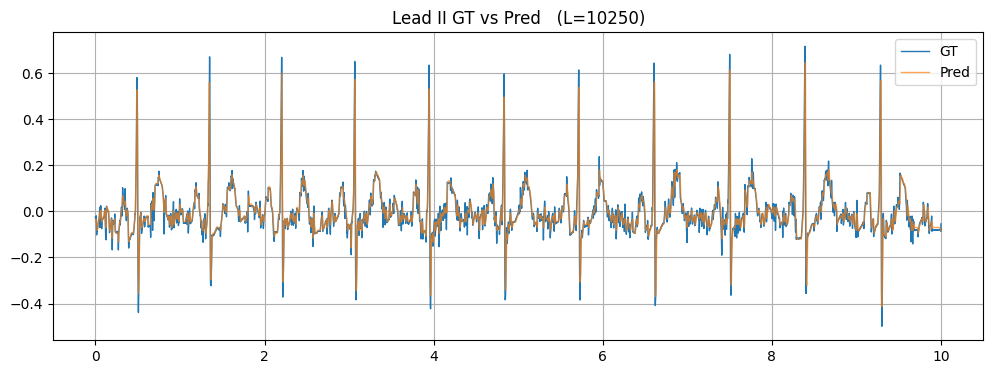

SNR = 8.048 dB


In [10]:
import matplotlib.pyplot as plt
import numpy as np
import cv2
import torch

def debug_full_pipeline(image_id, type_id="0001"):
    """
    1) Stage0 → normalised
    2) Stage1 → rectified + grid overlay
    3) Stage2 → heatmap overlay
    4) GT vs Pred Lead II
    """
    image_id = str(image_id)
    print(f"\n===== Debug id={image_id}, type={type_id} =====")

    # --- fs 가져오기 ---
    row = train_meta[train_meta["id"] == image_id]
    if len(row) == 0:
        print(f"[ERROR] train_meta에서 id={image_id} 찾을 수 없음")
        return
    row = row.iloc[0]
    fs = float(row["fs"])

    image_path = f"{KAGGLE_DIR}/train/{image_id}/{image_id}-{type_id}.png"
    csv_path   = f"{KAGGLE_DIR}/train/{image_id}/{image_id}.csv"

    # --- Stage0 ---
    image_bgr = cv2.imread(image_path)
    if image_bgr is None:
        print("[ERROR] 이미지 없음:", image_path)
        return

    normalised_rgb, keypoint, homo = run_stage0(stage0, image_bgr)

    plt.figure(figsize=(8,5))
    plt.title("Stage0: normalised")
    plt.imshow(normalised_rgb)
    plt.axis("off")
    plt.show()

    # --- Stage1 ---
    rectified_rgb, grid_xy = run_stage1(stage1, normalised_rgb)

    plt.figure(figsize=(8,5))
    plt.title("Stage1: rectified")
    plt.imshow(rectified_rgb)
    plt.axis("off")
    plt.show()

    # grid overlay
    from stage1_common import draw_mapping
    overlay1 = draw_mapping(rectified_rgb, grid_xy)

    plt.figure(figsize=(8,5))
    plt.title("Stage1 grid overlay")
    plt.imshow(overlay1)
    plt.axis("off")
    plt.show()

    # --- Stage2: series4 추출 ---
    length_long = int(np.floor(fs * 10.0))
    length_short = int(np.floor(fs * 2.5))

    series4 = run_stage2(stage2, rectified_rgb, length_long)

    # --- Stage2 heatmap overlay ---
    crop = rectified_rgb[Y0:Y1, X0:X1]
    crop_chw = np.ascontiguousarray(crop.transpose(2, 0, 1))

    with torch.no_grad():
        batch2 = {"image": torch.from_numpy(crop_chw).unsqueeze(0).to(DEVICE)}
        out2 = stage2(batch2)

    pixel = out2["pixel"].float().cpu().detach().numpy()[0]
    pixel_cropped = pixel[..., T0:T1]
    crop_cropped = crop[:, T0:T1]

    from stage2_common import draw_lead_pixel
    overlay2 = draw_lead_pixel(crop_cropped, pixel_cropped)

    plt.figure(figsize=(12,6))
    plt.title("Stage2 pixel overlay")
    plt.imshow(overlay2)
    plt.axis("off")
    plt.show()

    # --- 4 strip → 12리드 ---
    lead_lengths = {
        "I":   length_short, "II":  length_long, "III": length_short,
        "aVR": length_short, "aVL": length_short, "aVF": length_short,
        "V1":  length_short, "V2":  length_short, "V3":  length_short,
        "V4":  length_short, "V5":  length_short, "V6":  length_short,
    }

    series_by_lead = split_strips_to_leads(series4, lead_lengths)
    pred_ii = series_by_lead["II"]

    # --- GT 읽기 ---
    gt_df = pd.read_csv(csv_path)
    gt_ii = gt_df["II"].values

    L = min(len(gt_ii), len(pred_ii))
    t = np.arange(L) / fs

    # --- Lead II 비교 ---
    plt.figure(figsize=(12,4))
    plt.plot(t, gt_ii[:L], label="GT", linewidth=1)
    plt.plot(t, pred_ii[:L], label="Pred", linewidth=1, alpha=0.7)
    plt.title(f"Lead II GT vs Pred   (L={L})")
    plt.legend()
    plt.grid(True)
    plt.show()

    snr_score = snr(gt_ii[:L], pred_ii[:L])
    print(f"SNR = {snr_score:.3f} dB")

import pandas as pd

# --- CSV 불러오기 ---
CSV_PATH = "/content/leadII_snr_type0001_N200.csv"

snr_df = pd.read_csv(CSV_PATH)
snr_df = snr_df.sort_values("snr_lead_II_db")   # 낮은 SNR 먼저 정렬

print("총 샘플 수:", len(snr_df))
snr_df.head(10)

# --- SNR < 10 dB worst cases ---
bad_cases = snr_df[snr_df["snr_lead_II_db"] < 10]
worst_ids = bad_cases["id"].tolist()[:5]
worst_ids = [str(x) for x in worst_ids]  # 문자열로 변환
print("Worst-case IDs:", worst_ids)


for bad_id in worst_ids:
    debug_full_pipeline(bad_id, type_id="0001")



### 지식 증류 -- 입력 이미지 준비 (rectified images)

- 생성 완료하여 주석 처리

In [13]:
# # ================================
# # rectified 이미지 저장하기 -- student 모델 입력으로 쓸 것

# # /content/drive/MyDrive/physionet/rectified/{id}/{id}-{type}.rect.png
# # ================================

# import shutil

# RECT_ROOT_DIR = "/content/drive/MyDrive/physionet/rectified"



# # ================================
# # CONFIG: 타입별 생성 개수
# # ================================
# TYPE_CONFIG = {
#     "0003": 150,
#     "0004": 150,
#     "0005": 100,
#     "0006": 100,
#     "0009": 25,
#     "0010": 25,
#     "0011": 25,
#     "0012": 25,
# }

# # ================================
# # rectified 이미지 저장 함수
# # ================================
# def save_rectified_for_ids(image_ids, type_id="0001"):
#     for image_id in image_ids:
#         image_id = str(image_id)

#         # 출력 경로
#         out_path = os.path.join(RECT_ROOT_DIR, image_id, f"{image_id}-{type_id}.rect.png")

#         # 이미 존재하면 SKIP
#         if os.path.exists(out_path):
#             print(f"[SKIP] {out_path}")
#             continue

#         # 원본 이미지
#         image_path = f"{KAGGLE_DIR}/train/{image_id}/{image_id}-{type_id}.png"
#         img_bgr = cv2.imread(image_path, cv2.IMREAD_COLOR)

#         if img_bgr is None:
#             print(f"[ERROR] 원본 없음: {image_path}")
#             raise RuntimeError(f"원본 이미지 로딩 실패: {image_id}")

#         # Stage 0
#         normalised_rgb, keypoint, homo = run_stage0(stage0, img_bgr)

#         # Stage 1
#         rectified_rgb, grid_xy = run_stage1(stage1, normalised_rgb)

#         # id 폴더 생성
#         id_dir = os.path.join(RECT_ROOT_DIR, image_id)
#         os.makedirs(id_dir, exist_ok=True)

#         # 저장
#         ok = cv2.imwrite(out_path, cv2.cvtColor(rectified_rgb, cv2.COLOR_RGB2BGR))
#         if not ok:
#             print(f"[ERROR] 저장 실패: {out_path}")
#             raise RuntimeError(f"저장 실패: {out_path}")

#         print(f"saved: {out_path}")


In [14]:
# # ================================
# # 모델 로드
# # ================================
# stage0, stage1, stage2 = load_models()

# # train.csv 기준 id 목록
# all_ids = [str(x) for x in train_meta["id"].tolist()]  # 문자열 통일


# # ================================
# # 타입별 필요 수량만큼 자동 생성
# # ================================
# '''
# TYPE_CONFIG = {
#     "0003": 150,
#     "0004": 150,
#     "0005": 100,
#     "0006": 100,
#     "0009": 25,
#     "0010": 25,
#     "0011": 25,
#     "0012": 25,
# }
# 이만큼씩 생성함
# '''

# for type_id, needed_count in TYPE_CONFIG.items():
#     print(f"\n=====================================")
#     print(f"[TYPE {type_id}] 목표 개수 = {needed_count}")
#     print("=====================================\n")

#     created_count = 0

#     for image_id in all_ids:  # 0번부터 순서대로 탐색
#         # 해당 id 파일 경로
#         out_path = os.path.join(RECT_ROOT_DIR, image_id, f"{image_id}-{type_id}.rect.png")

#         # 이미 있으면 count만 증가
#         if os.path.exists(out_path):
#             created_count += 1
#             if created_count >= needed_count:
#                 break
#             continue

#         # 아직 부족하면 생성
#         save_rectified_for_ids([image_id], type_id=type_id)
#         created_count += 1

#         # 목표 개수 채우면 종료
#         if created_count >= needed_count:
#             print(f"[DONE] type {type_id}: {created_count}개 생성 완료")
#             break

#     print(f"[RESULT] type {type_id}: 총 {created_count}개 존재/생성됨")

In [15]:
import os

ROOT = "/content/drive/MyDrive/physionet/rectified"

total_files = 0
dir_count = 0

for root, dirs, files in os.walk(ROOT):
    # id 폴더 개수 세기
    if root == ROOT:
        dir_count = len(dirs)

    # 실제 파일(.png) 개수 세기
    for f in files:
        if f.endswith(".png"):
            total_files += 1

print("id 폴더 개수:", dir_count)
print("png 파일 개수:", total_files)

id 폴더 개수: 150
png 파일 개수: 600


In [16]:
import os

ROOT = "/content/drive/MyDrive/physionet/rectified"

counts = {}

for id_dir in sorted(os.listdir(ROOT)):
    full_path = os.path.join(ROOT, id_dir)
    if not os.path.isdir(full_path):
        continue

    pngs = [f for f in os.listdir(full_path) if f.endswith(".png")]
    counts[id_dir] = len(pngs)

print("전체 id 개수:", len(counts))
print("평균 파일 개수:", sum(counts.values()) / len(counts) if counts else 0)

# 상위 일부만 보기
for k in list(counts.keys())[:448]:
    print(k, counts[k])

전체 id 개수: 150
평균 파일 개수: 4.0
10140238 8
102150619 4
104573050 4
106482869 4
108599929 4
112870634 4
11842146 8
119693645 4
121471389 4
129883643 4
133948617 4
136433453 4
136524867 4
142408315 4
143477987 4
144746082 4
145098200 4
145375843 4
145399852 4
147393955 4
157249266 4
162622667 4
162686318 4
168239620 4
170158778 4
181086745 4
185534667 4
190186115 4
19030958 8
194732810 4
19585145 8
197560770 4
198290386 4
202594271 4
202613567 4
212782370 4
214041807 4
214789805 4
215513144 4
216148309 4
217252848 4
219464741 4
225208096 4
226831622 4
230071334 4
235672018 4
235857261 4
236587707 4
240241572 4
242807775 4
243863200 4
248896550 4
249637450 4
251145180 4
257884878 4
261884655 4
264050025 4
271844478 4
275951973 4
276854552 4
290502839 4
295786280 4
296219186 4
304464693 4
309723963 4
31175200 8
31294838 8
314575601 4
322270944 4
322694441 4
324905211 4
32650710 8
327451863 4
328766351 4
330177955 4
331919502 4
332019944 4
333400483 4
334628058 4
347249497 4
35187032 8
35577285

### 지식증류 -- 전체 파이프라인

In [17]:
import os
import glob
import cv2
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader

from stage2_model import Net as Stage2Net

CHECKPOINT_PATH = "/content/drive/MyDrive/physionet/archive/stage2-00005810.checkpoint.pth"
RECT_ROOT_DIR   = "/content/drive/MyDrive/physionet/rectified"
device = "cuda" if torch.cuda.is_available() else "cpu"

In [18]:
def load_teacher_stage2(checkpoint_path):
    teacher = Stage2Net(pretrained=False)  # checkpoint로 덮어쓸 거라 pretrained=False
    ckpt = torch.load(checkpoint_path, map_location="cpu")

    state_dict = ckpt["state_dict"]
    missing, unexpected = teacher.load_state_dict(state_dict, strict=False)
    print("Missing keys:", missing)
    print("Unexpected keys:", unexpected)

    teacher.eval()
    teacher.output_type = ["infer"]
    return teacher


teacher = load_teacher_stage2(CHECKPOINT_PATH).to(device)

Missing keys: []
Unexpected keys: []


In [19]:
class SmallUNet(nn.Module):
    def __init__(self, out_channels=4):
        super().__init__()
        self.enc1 = nn.Sequential(
            nn.Conv2d(3, 32, 3, padding=1), nn.ReLU(),
            nn.Conv2d(32, 32, 3, padding=1), nn.ReLU(),
        )
        self.pool1 = nn.MaxPool2d(2)

        self.enc2 = nn.Sequential(
            nn.Conv2d(32, 64, 3, padding=1), nn.ReLU(),
            nn.Conv2d(64, 64, 3, padding=1), nn.ReLU(),
        )
        self.pool2 = nn.MaxPool2d(2)

        self.bottleneck = nn.Sequential(
            nn.Conv2d(64, 128, 3, padding=1), nn.ReLU(),
            nn.Conv2d(128, 128, 3, padding=1), nn.ReLU(),
        )

        self.up1 = nn.ConvTranspose2d(128, 64, 2, stride=2)
        self.dec1 = nn.Sequential(
            nn.Conv2d(128, 64, 3, padding=1), nn.ReLU(),
            nn.Conv2d(64, 64, 3, padding=1), nn.ReLU(),
        )

        self.up2 = nn.ConvTranspose2d(64, 32, 2, stride=2)
        self.dec2 = nn.Sequential(
            nn.Conv2d(64, 32, 3, padding=1), nn.ReLU(),
            nn.Conv2d(32, 32, 3, padding=1), nn.ReLU(),
        )

        self.out = nn.Conv2d(32, out_channels, 1)

    def forward(self, x):
        e1 = self.enc1(x)
        p1 = self.pool1(e1)

        e2 = self.enc2(p1)
        p2 = self.pool2(e2)

        b = self.bottleneck(p2)

        d1 = self.up1(b)
        d1 = torch.cat([d1, e2], dim=1)
        d1 = self.dec1(d1)

        d2 = self.up2(d1)
        d2 = torch.cat([d2, e1], dim=1)
        d2 = self.dec2(d2)

        return self.out(d2)


student = SmallUNet(out_channels=4).to(device)

In [20]:
class RectifiedECGDataset(Dataset):
    def __init__(self, root_dir):
        self.paths = glob.glob(os.path.join(root_dir, "**", "*.rect.png"), recursive=True)
        self.paths = sorted(self.paths)
        print("총 rectified 이미지 개수:", len(self.paths))

        self.target_h = 1696
        self.target_w = 2192  # 2200이면 2192로 줄이기

    def __len__(self):
        return len(self.paths)

    def __getitem__(self, idx):
        path = self.paths[idx]
        img_bgr = cv2.imread(path, cv2.IMREAD_COLOR)
        if img_bgr is None:
            raise RuntimeError(f"이미지 로드 실패: {path}")
        img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

        h, w, _ = img_rgb.shape

        # 중앙 기준으로 crop (이미 rectified가 1700x2200 근처라고 가정)
        th, tw = self.target_h, self.target_w
        top = max((h - th) // 2, 0)
        left = max((w - tw) // 2, 0)
        img_rgb = img_rgb[top:top+th, left:left+tw]

        # H,W,3 → 3,H,W, uint8
        img_tensor = torch.from_numpy(img_rgb).permute(2, 0, 1).contiguous().byte()
        return img_tensor

In [21]:
dataset = RectifiedECGDataset(RECT_ROOT_DIR)
loader = DataLoader(dataset, batch_size=2, shuffle=True, num_workers=2)

총 rectified 이미지 개수: 600


In [22]:
import torch.nn.functional as F

def kd_pixel_loss(student_logits, teacher_logits):
    """
    teacher의 sigmoid 확률을 soft target으로 쓰는 KD용 loss.
    KL 말고 BCEWithLogits + MSE를 섞어서 안정적으로 학습.
    """
    with torch.no_grad():
        teacher_prob = torch.sigmoid(teacher_logits)  # [0,1]

    bce = F.binary_cross_entropy_with_logits(
        student_logits,
        teacher_prob,
        reduction="mean",
    )

    mse = F.mse_loss(
        torch.sigmoid(student_logits),
        teacher_prob,
    )

    # 가중치는 상황 따라 조절 가능
    loss = bce + 0.1 * mse
    return loss

In [24]:
# optimizer = torch.optim.Adam(student.parameters(), lr=3e-4)
# EPOCHS = 15
# T = 4.0
# SAVE_DIR = "/content/drive/MyDrive/physionet/kd"
# os.makedirs(SAVE_DIR, exist_ok=True)

# for epoch in range(EPOCHS):
#     student.train()
#     running = 0.0

#     for imgs in loader:
#         # imgs: uint8, 0~255
#         imgs = imgs.to(device)

#         # Teacher forward
#         with torch.no_grad():
#             t_out = teacher({"image": imgs})
#             t_logits = t_out["pixel"]            # (B,4,H,W)

#         # Student 입력은 float 정규화해서 사용
#         s_in = imgs.float() / 255.0
#         s_logits = student(s_in)                # (B,4,H,W)

#         loss = kd_pixel_loss(s_logits, t_logits)

#         optimizer.zero_grad()
#         loss.backward()
#         optimizer.step()

#         running += loss.item()

#     print(f"[Epoch {epoch+1}] loss = {running/len(loader):.4f}")

# torch.save(student.state_dict(),
#            f"{SAVE_DIR}/student_stage2_kd.pth")

# print("saved:", f"{SAVE_DIR}/student_stage2_kd.pth")